In [2]:
import timm
from timm.data import resolve_data_config
from timm.data.transforms_factory import create_transform
import os
import torch
from torchvision import transforms
from huggingface_hub import login, hf_hub_download
import numpy as np 
import faiss
# conda install -c conda-forge faiss-cpu

login()  # login with your User Access Token, found at https://huggingface.co/settings/tokens

# pretrained=True needed to load UNI weights (and download weights for the first time)
# init_values need to be passed in to successfully load LayerScale parameters (e.g. - block.0.ls1.gamma)
model = timm.create_model("hf-hub:MahmoodLab/uni", pretrained=True, init_values=1e-5, dynamic_img_size=True) #Create Function
transform = create_transform(**resolve_data_config(model.pretrained_cfg, model=model))
model.eval()


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=1024, out_features=3072, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=1024, out_features=1024, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=1024, out_features=4096, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (norm): 

In [9]:
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from pathlib import Path
import cv2 

#Books set w path object. Use books_set_filenames for str vers
books_set_path = Path("/Users/genesishang/books_set/images/").glob("*.png") 

# books_set_photos = [Image.open(p) for p in books_set_path]
books_set_filenames = [str(p) for p in books_set_path]
books_set_filenames[1] #Include good matches and if it works, 5 good matches should come up 



'/Users/genesishang/books_set/images/b7aec515-40cb-42ff-ab21-12f023bd7c97.png'

## Generate Books_Set Embeddings ## 

In [100]:

feature_embeddings = [] 
#Need to convert from RGBA to RGB then transform
for img_str in books_set_filenames:

    image = Image.open(img_str) #Create function
    image_rgb = image.convert('RGB')
    image = transform(image_rgb).unsqueeze(dim=0) # Image (torch.Tensor) with shape [1, 3, 224, 224] following image resizing and normalization (ImageNet parameters)

    #extract features 
    with torch.inference_mode():
        feature_emb = model(image) # Extracted features (torch.Tensor) with shape [1,1024]
        feature_embeddings.append(feature_emb) #Create function to deal with embeddings

feature_embeddings = np.array(feature_embeddings)
np.save('uni_embeddings.npy', feature_embeddings)


TypeError: list indices must be integers or slices, not str

Forgot to incorporate uids... so adding them here

In [ ]:
import numpy as np
import json
import os

# Load the embeddings and JSON data
embeddings = np.load('uni_embeddings.npy')
with open('/Users/genesishang/books_set/captions.json', 'r') as f:
    uid_data = json.load(f)
uid_data

# Create a dictionary to store the UUID -> embedding mapping
feature_embeddings = {}

# Iterate over your image list and map them to the UUID in the JSON
for idx, img_str in enumerate(books_set_filenames):
    img_filename = os.path.splitext(os.path.basename(img_str))[0] 

    # Find the matching UUID in the JSON data
    matching_uid = None
    for key, metadata in uid_data.items():
        if metadata['uuid'] == img_filename:  # Match the filename with the 'uuid' from the JSON
            matching_uid = metadata['uuid']
            break

    if matching_uid:
        feature_embeddings[matching_uid] = embeddings[idx]  # Map embedding to corresponding UUID

np.save('uni_embeddings_with_uids.npy', feature_embeddings, allow_pickle=True)

Need to make 3D embeddings 2D, so reshape

In [10]:
data = np.load('uni_embeddings.npy') #Outputs 3D embeddings so..
new_data = data.reshape(data.shape[0]*data.shape[1], data.shape[2])
d = new_data.shape[-1]
d

1024

Repeat process with evaluation set (matches.zip) ... Will clean up and reorganize into functions for future use later

In [22]:
#Generate embeddings for matchez.zip for eval

#Books set w path object. Use books_set_filenames for str vers
matches_path_1 = Path("/Users/genesishang/Downloads/matches").glob("*.jpg") 
matches_path_2 = Path("/Users/genesishang/Downloads/matches").glob("*.png") 

# books_set_photos = [Image.open(p) for p in books_set_path]
matches_filenames_1 = [str(p) for p in matches_path_1]
matches_filenames_2 = [str(p) for p in matches_path_2]
matches = matches_filenames_1+matches_filenames_2 #Include good matches and if it works, 5 good matches should come up 


In [158]:
import numpy as np
import json
import os

# Load the embeddings and JSON data
embeddings = np.load('uni_embeddings.npy')
with open('/Users/genesishang/books_set/captions.json', 'r') as f:
    uid_data = json.load(f)
uid_data

# Create a dictionary to store the UUID -> embedding mapping
feature_embeddings = {}

# Iterate over your image list and map them to the UUID in the JSON
for idx, img_str in enumerate(books_set_filenames):
    img_filename = os.path.splitext(os.path.basename(img_str))[0] 

    # Find the matching UUID in the JSON data
    matching_uid = None
    for key, metadata in uid_data.items():
        if metadata['uuid'] == img_filename:  # Match the filename with the 'uuid' from the JSON
            matching_uid = metadata['uuid']
            break

    if matching_uid:
        feature_embeddings[matching_uid] = embeddings[idx]  # Map embedding to corresponding UUID

np.save('uni_embeddings_with_uids.npy', feature_embeddings, allow_pickle=True)


In [11]:
data_uids = np.load('uni_embeddings_with_uids.npy', allow_pickle=True).item()
data_uids = list(data_uids.values())
data_uids_array = np.array(data_uids)
new_data_uids = data_uids_array.reshape(data_uids_array.shape[0]*data_uids_array.shape[1], data_uids_array.shape[2])
d = new_data_uids.shape[1] #Dimension



Total index size check 

In [279]:
len(matches) + len(books_set_filenames) 

4318

In [12]:
# index.add() #Add eval embeddings
data_matches = np.load('uni_embeddings_matches.npy') #Outputs 3D embeddings so..
new_data_matches = data_matches.reshape(data_matches.shape[0]*data_matches.shape[1], data_matches.shape[2])
# d = new_data.shape[-1]


Create FAISS Index object and add our evaluation set + books_set (can use pubmed_set later)

In [13]:
#IndexFlatL2

index = faiss.IndexFlatL2(d) 

In [14]:
index.is_trained

True

In [15]:
index.add(new_data_uids)
index.add(new_data_matches) #Add matches for eval into database

In [16]:
index.ntotal

4318

Prepare query image

In [17]:
#Query image.. Making it random
import random
with torch.no_grad():
    i = '/Users/genesishang/books_set/images/1d30c0e9-75d1-461a-8a08-88f2bab050a9.png'
    # random.seed(1)

    #uuid 2871
    image = Image.open(i) #Create function
    image_rgb = image.convert('RGB')
    image = transform(image_rgb).unsqueeze(dim=0) # Image (torch.Tensor) with shape [1, 3, 224, 224] following image resizing and normalization (ImageNet parameters)

    xq = model(image)



Make sure compatible with FAISS 

In [18]:
xq = xq.cpu().detach().numpy()
xq.dtype

dtype('float32')

Performing knn

In [23]:
k = 4                         # we want to see 4 nearest neighbors
D, I = index.search(xq, k) # sanity check
D = D[0].tolist()
I = I[0].tolist()

Indices of best matches in index to query image

In [24]:
I

[1443, 1076, 892, 4235]

List version of our database to access what photos grabbed

In [25]:
db = books_set_filenames + matches
len(db)

4318

Access photos

Query Image: uid - 2871

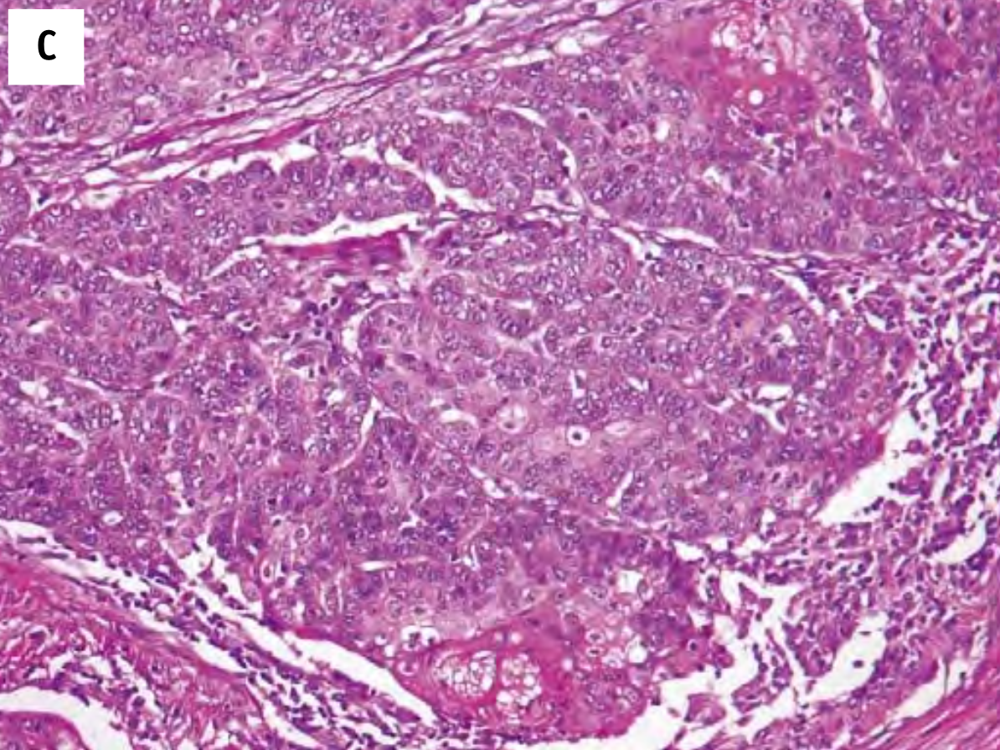

In [27]:
Image.open(i)

Resulting Matches:

In [34]:
results = [db[I[0]], db[I[1]], db[I[2]],db[I[3]]] #No good matches returned for image w uid 2871

In [38]:
results

['/Users/genesishang/books_set/images/1d30c0e9-75d1-461a-8a08-88f2bab050a9.png',
 '/Users/genesishang/books_set/images/24326c78-dda2-48ad-b084-3d0a4025ba4a.png',
 '/Users/genesishang/books_set/images/3ea8817a-4506-421e-9a57-dca6084310a7.png',
 '/Users/genesishang/books_set/images/ba9c1138-d829-4deb-918c-1d018164e357.png']

None of our good matches retrieved

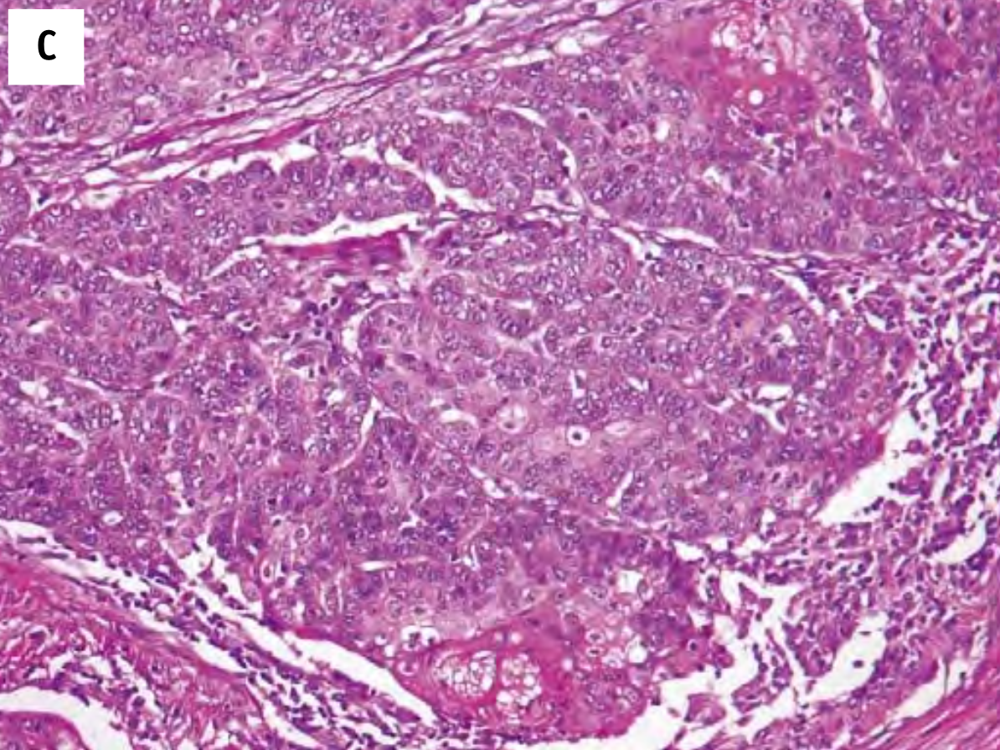

In [30]:
Image.open(results[0])

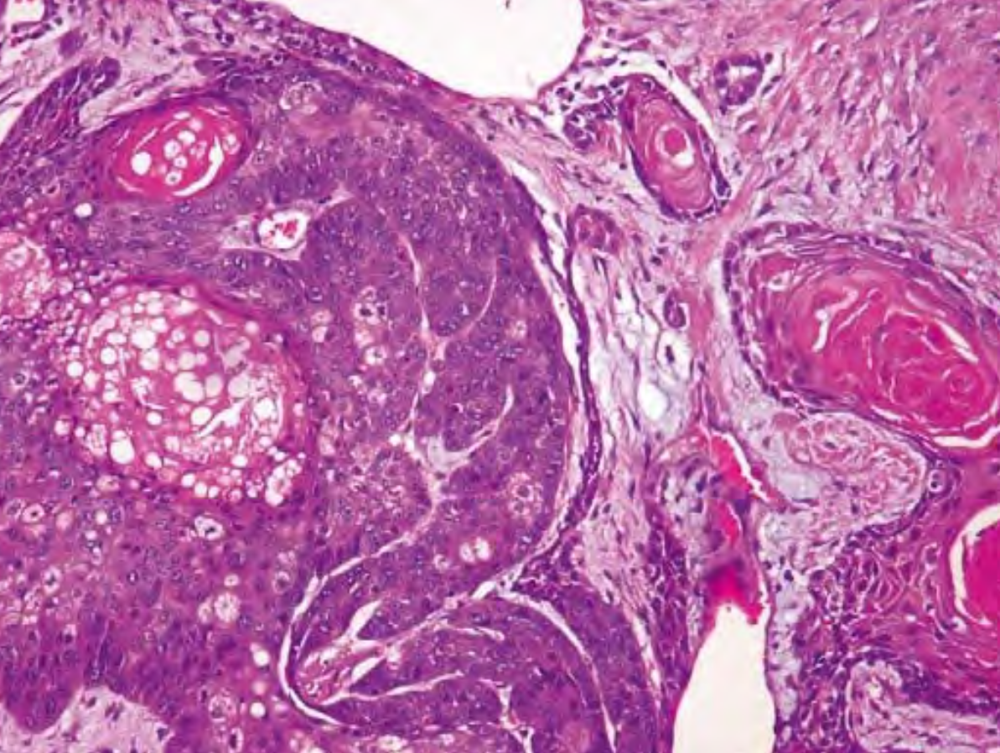

In [31]:
Image.open(results[1])

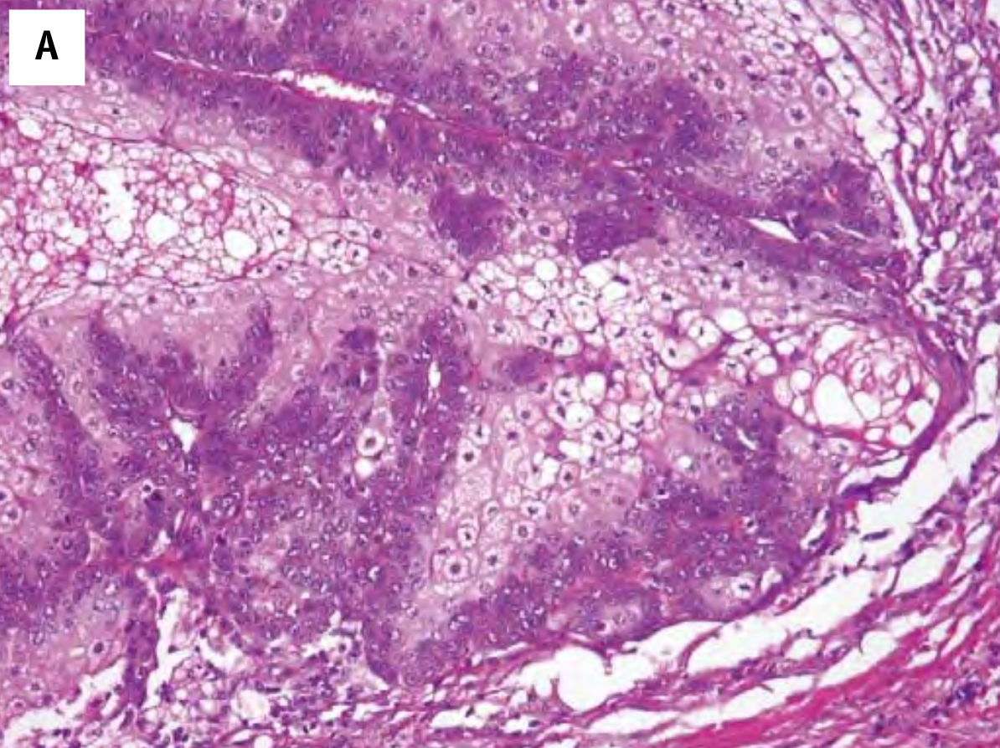

In [32]:
Image.open(results[2])

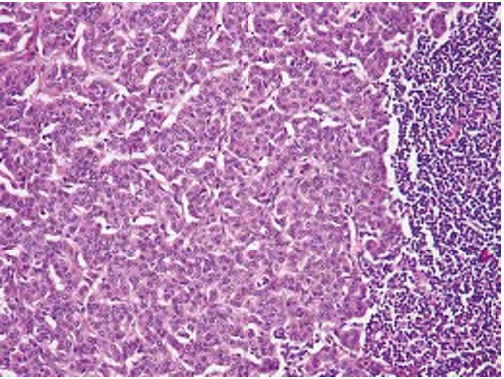

In [33]:
Image.open(results[3])